### Import Libraries

In [1]:
from itertools import groupby
import numpy as np
from tqdm.notebook import tqdm
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt
import wandb
from PIL import Image
import tifffile
import gc
import itertools
import yaml
import json

# from glob import glob
import matplotlib.pyplot as plt

In [2]:
#!pip install segmentation-models-pytorch
#!pip install cmaes
#!pip install supervision
#!pip install shapely==2.0.4
#!pip install ttach
# !pip install vision-transformer-pytorch
# !pip install pytorch_metric_learning

In [3]:
#!git clone https://github.com/Solafune-Inc/FieldAreaSegmentation.git

In [4]:
import yaml
import timm 
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
from torch.nn.modules.loss import _Loss
import segmentation_models_pytorch as smp
from segmentation_models_pytorch.base.initialization import initialize_decoder
from segmentation_models_pytorch.base import modules as md

# from pytorch_metric_learning.distances import LpDistance, CosineSimilarity
# from pytorch_metric_learning.losses import ArcFaceLoss
# from vision_transformer_pytorch import VisionTransformer

# Lightning module
import torch
import pytorch_lightning as pl
from pytorch_lightning.loggers import WandbLogger
from torch.optim.lr_scheduler import CosineAnnealingLR, ReduceLROnPlateau
from torch.optim import AdamW, Adam
import torch.nn as nn
from torchmetrics.functional import dice
from torchmetrics.classification import F1Score
from torchmetrics.classification import JaccardIndex
from torchmetrics.functional.classification import binary_accuracy, binary_f1_score
from sklearn.metrics import roc_auc_score, f1_score

from timm.optim.optim_factory import create_optimizer
from types import SimpleNamespace

import wandb

### CFG

In [ ]:
class CFG:
    debug = False
    classes = 1
    select_fold = 0 # 3fold分(0, 1, 2)実行してください
    original_data_root = os.path.join(os.getcwd(), "data/") # オリジナルのデータセットのパスを指定してください
    data_root = os.path.join(os.getcwd(), "preprocessed_data/") # field-area-segmentation-semantic-dataset-v8.ipynbの出力を指定してください
    stride = 64
    batch_size = 4
    threshold = 0.5
    mask_types = ["mask", "mask_bound"]
    diff_threshold = 0.7
    train_data_root = f"training_fold-{select_fold}" # field-area-semantic-training-v8.ipynbの出力を指定してください
    opt_data_root = False
    diff_thresholds = [0.55]
    buffers = [0.966667]
    area_ths = [33.333333]
    exec_test_pred = False
    test_data_root = False # f"/kaggle/input/field-area-semantic-test-fold{select_fold}-v1"
    use_model_idx = []
    
    
    # ------------------
    if debug:
        max_epochs = 1
        min_epochs = 1
    else:
        max_epochs = 45
        min_epochs = 20
    
    # ------------------
    with open(f'{data_root}/cfg.yaml', 'r') as yml:
        config = yaml.safe_load(yml)
    train_statistics = pd.read_csv(f"{data_root}/calc_static/train_statistics.csv")
    if (config["image_suffix"] == "tif") & (config['use_channel'] != "all"):
        mean = list(train_statistics["mean"].iloc[config["use_channel"]])
        std = list(train_statistics["std"].iloc[config["use_channel"]])
    else:
        mean = list(train_statistics["mean"])
        std = list(train_statistics["std"])
    in_chans = len(mean)
    
    # ------------------
    meta = pd.read_csv(f"{data_root}/ann_meta.csv")
    meta["segmentations"] = meta["segmentations"].apply(eval)
    meta["file_name"] = "images/" + meta["file_name"].str.replace(".tif", ".npz")
    train_files = meta[meta["fold"] != select_fold]["file_name"].values
    valid_files = meta[meta["fold"] == select_fold]["file_name"].values
    valid_segmentation = meta[meta["fold"] == select_fold]["segmentations"].values
    
    test_files = np.array(["test/" + _ for _ in os.listdir(f"{data_root}/test")])
    inds = np.argsort([int(_.split("/")[-1].split("_")[-1].replace(".npz", "")) for _ in test_files])
    test_files = test_files[inds]

### Model

In [6]:
import math
from torch.nn.modules.utils import _pair, _quadruple


class MedianPool2d(nn.Module):
    """ Median pool (usable as median filter when stride=1) module.
    
    Args:
         kernel_size: size of pooling kernel, int or 2-tuple
         stride: pool stride, int or 2-tuple
         padding: pool padding, int or 4-tuple (l, r, t, b) as in pytorch F.pad
         same: override padding and enforce same padding, boolean
    """
    def __init__(self, kernel_size=3, stride=1, padding=0, same=False):
        super(MedianPool2d, self).__init__()
        self.k = _pair(kernel_size)
        self.stride = _pair(stride)
        self.padding = _quadruple(padding)  # convert to l, r, t, b
        self.same = same
        torch.use_deterministic_algorithms(mode=True, warn_only=True)

    def _padding(self, x):
        if self.same:
            ih, iw = x.size()[2:]
            if ih % self.stride[0] == 0:
                ph = max(self.k[0] - self.stride[0], 0)
            else:
                ph = max(self.k[0] - (ih % self.stride[0]), 0)
            if iw % self.stride[1] == 0:
                pw = max(self.k[1] - self.stride[1], 0)
            else:
                pw = max(self.k[1] - (iw % self.stride[1]), 0)
            pl = pw // 2
            pr = pw - pl
            pt = ph // 2
            pb = ph - pt
            padding = (pl, pr, pt, pb)
        else:
            padding = self.padding
        return padding
    
    def forward(self, x):
        # using existing pytorch functions and tensor ops so that we get autograd, 
        # would likely be more efficient to implement from scratch at C/Cuda level
        x = F.pad(x, self._padding(x), mode='reflect')
        x = x.unfold(2, self.k[0], self.stride[0]).unfold(3, self.k[1], self.stride[1])
        x = x.contiguous().view(x.size()[:4] + (-1,)).median(dim=-1)[0]
        return x


class Model(nn.Module):
    def __init__(self, cfg, pretrained=True, tta=None, mask_type=None):
        super().__init__()
        self.mask_type = mask_type
        name = cfg['model']['encoder']
        pretrained = 'imagenet' if (pretrained and cfg['model']['pretrained']) else None
        decoder_channels = cfg['model']['decoder_channels']  # (256, 128, 64, 32, 16)
        # self.median_pool = MedianPool2d(kernel_size=3, stride=1, padding=1, same=False)
        
        if cfg['model']['segmentation'] == "Unet":
            self.unet = smp.Unet(name,
                                 encoder_weights=pretrained,
                                 classes=cfg['model']['classes'],
                                 in_channels=cfg['model']['in_chans'],
                                 decoder_channels=decoder_channels
                                  )
        elif cfg['model']['segmentation'] == "UnetPlusPlus":
            self.unet = smp.UnetPlusPlus(name,
                                 encoder_weights=pretrained,
                                 classes=cfg['model']['classes'],
                                 in_channels=cfg['model']['in_chans'],
                                 decoder_channels=decoder_channels
                                  )
        elif cfg['model']['segmentation'] == "MAnet":
            self.unet = smp.MAnet(name,
                                 encoder_weights=pretrained,
                                 classes=cfg['model']['classes'],
                                 in_channels=cfg['model']['in_chans'],
                                 decoder_channels=decoder_channels
                                  )
        else:
            raise

    def unsharp_masking(self, imgs, k=0.7):

        kernel = torch.FloatTensor([
            [-k, -k, -k],
            [-k, 1+(8*k), -k],
            [-k, -k, -k]
        ])

        filter_ = kernel.expand(1, 1, 3, 3).to(torch.float32).to(device)  # [h,w] ⇒ [mb,c,h,w]
        output = F.conv2d(imgs, filter_, padding=1)

        return output
            
    def forward(self, x):
        
        y_pred = self.unet(x)

        return y_pred

In [7]:
model_cfg_list = os.listdir(f"{CFG.train_data_root}/model_cfg")
model_cfg_list.sort()

cfgs = []
for p in model_cfg_list:
    with open(f"{CFG.train_data_root}/model_cfg/{p}",'r') as f:
        cfg = yaml.safe_load(f)
    cfgs.append(cfg)

if len(CFG.use_model_idx) != 0:
    cfgs = np.array(cfgs)[CFG.use_model_idx].tolist()
cfgs

[{'model': {'classes': 1,
   'decoder_channels': [256, 128, 64, 32, 32],
   'dropout': 0.0,
   'encoder': 'tu-resnest26d',
   'height': 512,
   'in_chans': 23,
   'out_indices': 'None',
   'pretrained': True,
   'segmentation': 'UnetPlusPlus',
   'width': 512}},
 {'model': {'classes': 1,
   'decoder_channels': [256, 128, 64, 32, 32],
   'dropout': 0.0,
   'encoder': 'tu-maxvit_small_tf_512',
   'height': 512,
   'in_chans': 23,
   'out_indices': 'None',
   'pretrained': True,
   'segmentation': 'UnetPlusPlus',
   'width': 512}},
 {'model': {'classes': 1,
   'decoder_channels': [256, 128, 64, 32, 32],
   'dropout': 0.0,
   'encoder': 'tu-maxxvitv2_rmlp_base_rw_384',
   'height': 384,
   'in_chans': 23,
   'out_indices': 'None',
   'pretrained': True,
   'segmentation': 'UnetPlusPlus',
   'width': 384}}]

#### Check

In [8]:
os.makedirs(f'training_opt_fold-{CFG.select_fold}/model_cfg', exist_ok=True)
for i, cfg in enumerate(cfgs):
    print(f'-- {i:02} --',cfg['model']['encoder'], '-'*10)
    with open(f'training_opt_fold-{CFG.select_fold}/model_cfg/cfg{i:02}.yaml','w') as f:
        yaml.dump(cfg, f, default_flow_style=False, allow_unicode=True)

-- 00 -- tu-resnest26d ----------
-- 01 -- tu-maxvit_small_tf_512 ----------
-- 02 -- tu-maxxvitv2_rmlp_base_rw_384 ----------


In [9]:
if CFG.debug:

    sample_idx = 0
    
    for i, cfg in enumerate(cfgs):
        print(f'-- {i:02} --',cfg['model']['encoder'], '-'*10)

        model = Model(cfg=cfg, mask_type="mask")
        model.eval()

        in_chans = cfg['model']['in_chans']
        m = model.unet.encoder

        x = torch.randn(2, cfg['model']['in_chans'], cfg['model']['height'], cfg['model']['width'])
        print('x:', x.shape)
        oo = m(x)
        for i, o in enumerate(oo):
             print(f'{i}:', o.shape)

        logit = model.forward(x)
        print('\nforward:', logit.shape, '\n')
        
    loss_module_dice = smp.losses.DiceLoss(mode="binary")
    loss_module_bce = smp.losses.SoftBCEWithLogitsLoss(pos_weight=torch.FloatTensor([1.0]), reduction=None)
    loss_module_focal1 = smp.losses.FocalLoss(mode='binary', gamma=4.0, reduction=None) # , alpha=0.0
    loss_module_focal2 = smp.losses.FocalLoss(mode='binary', gamma=4.0) # , alpha=0.0

    p1 = torch.randn(2, 1, cfg['model']['height'], cfg['model']['width'])
    p1 = torch.where(p1 > 0.2, 1.0, 0.0)
    print(loss_module_focal1(p1, logit).view(-1, 1, cfg['model']['height'], cfg['model']['width']).shape)
    print(loss_module_focal2(p1, logit))

### Dataset

In [10]:
import torchvision.transforms as T
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torch.utils.data import DataLoader
# from torchvision.transforms import v2
import ttach as tta

def cutmix(batch, alpha=0.5):
    
    imgs, labels = batch
    
    indices = torch.randperm(imgs.size(0))
    shuffled_imgs = imgs[indices]
    shuffled_labels = labels[indices]

    lam = np.random.beta(alpha, alpha)
    
    image_h, image_w = imgs.shape[-2], imgs.shape[-1]
    cx = np.random.uniform(0, image_w)
    cy = np.random.uniform(0, image_h)
    w = image_w * np.sqrt(1 - lam)
    h = image_h * np.sqrt(1 - lam)
    x0 = int(np.round(max(cx - w / 2, 0)))
    x1 = int(np.round(min(cx + w / 2, image_w)))
    y0 = int(np.round(max(cy - h / 2, 0)))
    y1 = int(np.round(min(cy + h / 2, image_h)))
    
    imgs[..., y0:y1, x0:x1] = shuffled_imgs[..., y0:y1, x0:x1]
    labels[..., y0:y1, x0:x1] = shuffled_labels[..., y0:y1, x0:x1]
        
    return imgs, labels

def mosaic(batch):
    
    imgs, labels = batch
    
    indices = torch.randperm(imgs.size(0))
    shuffled_imgs = imgs[indices]
    shuffled_labels = labels[indices]
    
    # images info
    size_x, size_y = imgs.size(-1), imgs.size(-2)
    center_x = size_x // 2
    center_y = size_y // 2
    diff_x = size_x // 4
    diff_y = size_y // 4

    # mosaic center x, y
    mosaic_center_x = int(np.random.uniform(center_x - diff_x, center_x + diff_x))
    mosaic_center_y = int(np.random.uniform(center_y - diff_y, center_y + diff_y))
    center_position = (mosaic_center_x, mosaic_center_y)
    
    boxes = []
    for loc in ['top_left', 'top_right', 'bottom_left', 'bottom_right']:
        if loc == 'top_left':
            x0 = 0
            x1 = center_position[0]
            y0 = 0
            y1 = center_position[1]
        elif loc == 'top_right':
            x0 = center_position[0]
            x1 = size_x
            y0 = 0
            y1 = center_position[1]
        elif loc == 'bottom_left':
            x0 = 0
            x1 = center_position[0]
            y0 = center_position[1]
            y1 = size_y
        else:
            x0 = center_position[0]
            x1 = size_x
            y0 = center_position[1]
            y1 = size_y
        boxes.append([x0, y0, x1, y1])
    
    break_c = int(np.random.uniform(1, 4))
    np.random.shuffle(boxes)
    for c, box in enumerate(boxes):
        x0, y0, x1, y1 = box
        imgs[..., y0:y1, x0:x1] = shuffled_imgs[..., y0:y1, x0:x1]
        labels[..., y0:y1, x0:x1] = shuffled_labels[..., y0:y1, x0:x1]
        if c == break_c:
            break
    
    return imgs, labels

class DataTransform():
    def __init__(self, height, width, image_div):  
        self.height = height
        self.width = width
        interpolation = cv2.INTER_CUBIC # cv2.INTER_LINEAR
        self.data_transform = {
            "train": A.Compose(
                [
                    A.RandomCrop(height=self.height // image_div, width=self.width // image_div, p=1),
                    # A.RandomResizedCrop(height=self.height, width=self.width, p=1, scale=(0.6, 0.9), ratio=(1, 1)),
                    A.Resize(height=self.height, width=self.width, interpolation=interpolation, p=1),
                    A.ShiftScaleRotate(p=0.5, shift_limit=0.0625, scale_limit=0.1, rotate_limit=15),
                    # A.GridDistortion(p=0.35),
                    # A.Perspective(p=0.5),
                    A.HorizontalFlip(p=0.5),
                    A.VerticalFlip(p=0.5),
                    A.Transpose(p=0.5),
                    A.RandomRotate90(p=0.5),
                    # A.GaussianBlur(p=0.25),
                    # A.PadIfNeeded(p=1.0, pad_width_divisor=32, pad_height_divisor=32),  # 1000x1000 to 1024x1024
                    ToTensorV2(),
                ]
            ),
            "valid": A.Compose(
                [
                    # A.Resize(height=self.height, width=self.width, interpolation=interpolation, p=1),
                    ToTensorV2(),
                ]
            ),
            "test": A.Compose(
                [
                    # A.Resize(height=self.height, width=self.width, interpolation=interpolation, p=1),
                    ToTensorV2(),
                ]
            ),
        }


    def __call__(self, phase, img, anno_class_img):
        return self.data_transform[phase](image=img, mask=anno_class_img)

    
class FieldDataset(torch.utils.data.Dataset):
    def __init__(self, phase, files, transform, mask_type):
                
        self.phase = phase
        self.files = files
        self.transform = transform
        self.mask_type = mask_type
        self.normalize_image = T.Normalize(CFG.mean, CFG.std)
        self.normalize_size = len(CFG.mean)

    def __len__(self):
        return len(self.files)

    def __getitem__(self, index):
        
        npz = np.load(f'{CFG.data_root}/{self.files[index]}')
        imgs = npz["image"]
        labels = npz[self.mask_type]

        imgs = imgs.astype(np.float32)
        labels = labels.astype(np.float32)
        
        img_and_label = self.transform(self.phase, imgs, labels)
        img = img_and_label["image"]
        mask = img_and_label["mask"]
        
        img = self.normalize_image(img)
        
        return img, mask

In [11]:
# define dataset root and directory for images and annotations
device = 'cuda' if torch.cuda.is_available() else 'cpu'
num_workers = os.cpu_count()

if CFG.debug:
    
    cfg = cfgs[0]
    train_dataset = FieldDataset(phase="train", files=CFG.train_files, transform=DataTransform(cfg['model']['height'], cfg['model']['width']), mask_type=CFG.mask_types[0])
    val_dataset = FieldDataset(phase="valid", files=CFG.valid_files, transform=DataTransform(cfg['model']['height'], cfg['model']['width']), mask_type=CFG.mask_types[0])
    print(f"train_dataset: {len(train_dataset)}", f"val_dataset: {len(val_dataset)}")

    train_dataloader = DataLoader(train_dataset, batch_size=CFG.batch_size, shuffle=True, num_workers=num_workers, drop_last=True)
    val_dataloader = DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=num_workers)

    
    plt.figure(figsize=(8, 4))
    
    batch = next(iter(val_dataloader))
    img, labels = batch
    print('images:', img.shape)
    print('labels:', labels.shape)
    plt.subplot(1, 2, 1)
    plt.imshow(labels[0].detach().cpu().numpy())
    
    batch = next(iter(train_dataloader))
    img, labels = batch
    print('images:', img.shape)
    print('labels:', labels.shape)
    
    plt.subplot(1, 2, 2)
    plt.imshow(labels[0].detach().cpu().numpy())

### Training

In [12]:
config = yaml.safe_load(f"""
data_path: "/kaggle/input/contrails-images-ash-color"
output_dir: "training_opt_fold-{CFG.select_fold}/models"

seed: 42
n_trials: 1000 # 1000

train_bs: {CFG.batch_size}
valid_bs: {CFG.batch_size}
workers: {num_workers}

progress_bar_refresh_rate: 1

early_stop:
    monitor: "val_loss"
    mode: "min"
    patience: 10
    verbose: False
    min_delta: 0.0

trainer:
    max_epochs: {CFG.max_epochs}
    min_epochs: {CFG.min_epochs}
    enable_progress_bar: True

model:
    loss_module: "jaccard"
    loss_smooth: 0.01
    loss_gamma: 4.0
    optimizer_params:
        lr: 0.0001
        weight_decay: 0.01
        amsgrad: False
    scheduler:
        name: "ReduceLROnPlateau"
        params:
            CosineAnnealingLR:
                T_max: 2
                eta_min: 1.0e-6
                last_epoch: -1
            ReduceLROnPlateau:
                mode: "min"
                factor: 0.5
                patience: 4
                verbose: True
    slide:
        h_stride: {CFG.stride}
        w_stride: {CFG.stride}
        h_crop: 0
        w_crop: 0
        image_div: 1
    aug:
        cutmix: 1.0
        mosaic: 1.0
    tta: True
        
""")

with open(f'training_opt_fold-{CFG.select_fold}/config.yaml','w') as f:
    yaml.dump(config, f, default_flow_style=False, allow_unicode=True)

In [13]:
def F1Score_instance(all_labels, all_preds, threshold=0.5, sample=False):
    f1s = F1Score(task='binary', multidim_average="samplewise", threshold=threshold).to(device)
    f1 = F1Score(task='binary', multidim_average="global", threshold=threshold).to(device)

    zeromask = torch.where(all_labels.view(all_labels.size()[0], -1).sum(dim=1) == 0)
    f1_score_global = f1(all_preds, all_labels.long())
    f1_score_sample = f1s(all_preds, all_labels.long())
    f1_score_sample_adj = f1_score_sample.clone()
    f1_score_sample_adj[zeromask] = torch.where(f1_score_sample_adj[zeromask] == 0, 1, f1_score_sample_adj[zeromask])
    
    if sample:
        return f1_score_global.item(), f1_score_sample_adj
    else:
        return f1_score_global.item(), f1_score_sample_adj.mean().item()

def JaccardScore_instance(all_labels, all_preds, threshold=0.5, sample=False):
    f1s = JaccardIndex(task='binary', average='micro', threshold=threshold).to(device)
    f1 = JaccardIndex(task='binary', average='macro', threshold=threshold).to(device)
    
    f1_score_global = f1(all_preds, all_labels.long())
    f1_score_sample = f1s(all_preds, all_labels.long())
    f1_score_sample_adj = f1_score_sample.clone()
    
    return f1_score_global.item(), f1_score_sample_adj.item()

class FocalTverskyLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(FocalTverskyLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1, alpha=0.7, beta=0.3, gamma=4/3):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = F.sigmoid(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        #True Positives, False Positives & False Negatives
        TP = (inputs * targets).sum()    
        FP = ((1-targets) * inputs).sum()
        FN = (targets * (1-inputs)).sum()
        
        Tversky = (TP + smooth) / (TP + alpha*FP + beta*FN + smooth)  
        FocalTversky = (1 - Tversky)**gamma
                       
        return FocalTversky
    
    
class LightningModule(pl.LightningModule):
    def __init__(self, model, config):
        super().__init__()
        self.config = config["model"]
        self.model = model
        self.loss_module_dice = smp.losses.DiceLoss(mode="binary", smooth=self.config["loss_smooth"])
        self.loss_module_bce = smp.losses.SoftBCEWithLogitsLoss(smooth_factor=self.config["loss_smooth"])
        self.loss_module_focal = smp.losses.FocalLoss(mode='binary', gamma=self.config["loss_gamma"])
        self.loss_module_lovasz = smp.losses.LovaszLoss(mode='binary')
        self.loss_module_jaccard = smp.losses.JaccardLoss(mode='binary')
        self.loss_focaltversky = FocalTverskyLoss()
        self.val_step_outputs = []
        self.val_step_labels = []
        self.f1_score_sample_adj = 0.0

    def slide_inference(self, img):
        """Inference by sliding-window with overlap.

        If h_crop > h_img or w_crop > w_img, the small patch will be used to
        decode without padding.
        """
        image_div = self.config["slide"]["image_div"]
        h_stride, w_stride = self.config["slide"]["h_stride"], self.config["slide"]["w_stride"]
        h_crop, w_crop = self.config["slide"]["h_crop"] // image_div, self.config["slide"]["w_crop"] // image_div

        batch_size, _, h_img, w_img = img.size()
        out_channels = CFG.classes
        h_grids = max(h_img - h_crop + h_stride - 1, 0) // h_stride + 1
        w_grids = max(w_img - w_crop + w_stride - 1, 0) // w_stride + 1
        preds = img.new_zeros((batch_size, out_channels, h_img, w_img))
        count_mat = img.new_zeros((batch_size, 1, h_img, w_img))
        
        for h_idx in range(h_grids):
            for w_idx in range(w_grids):
                y1 = h_idx * h_stride
                x1 = w_idx * w_stride
                y2 = min(y1 + h_crop, h_img)
                x2 = min(x1 + w_crop, w_img)
                y1 = max(y2 - h_crop, 0)
                x1 = max(x2 - w_crop, 0)
                crop_img = img[:, :, y1:y2, x1:x2]
                if image_div != 1:
                    crop_img = torch.nn.functional.interpolate(
                        crop_img, 
                        size=(self.config["slide"]["h_crop"], self.config["slide"]["w_crop"]), 
                        mode='bicubic'
                    )
                if self.config["tta"]:
                    crop_seg_logit = self.tta_pred(crop_img)
                else:
                    crop_seg_logit = self.model(crop_img)
                if image_div != 1:
                    crop_seg_logit = torch.nn.functional.interpolate(crop_seg_logit, size=(h_crop, w_crop), mode='area')
                preds += F.pad(crop_seg_logit,
                               (int(x1), int(preds.shape[3] - x2), int(y1),
                                int(preds.shape[2] - y2)))

                count_mat[:, :, y1:y2, x1:x2] += 1
        assert (count_mat == 0).sum() == 0

        preds = preds / count_mat

        return preds
        
    def tta_pred(self, x):
        
        if CFG.exec_test_pred:
            transforms = tta.Compose(
                [
                    tta.HorizontalFlip(),
                    tta.VerticalFlip(),
                    tta.Rotate90(angles=[0, 90, 180, 270]),
                    # tta.Scale(scales=[1, 2]),
                    # tta.Multiply(factors=[0.9, 1, 1.1]),        
                ]
            )
        else:
            transforms = tta.Compose([tta.HorizontalFlip()])

        tta_logit = torch.zeros((len(transforms), x.shape[0], 1, x.shape[-2], x.shape[-1])).to(device)

        # Here `image`/`mask` are 4D tensors (B, C, H, W), `label` is 2D tensor (B, N)
        for i, transformer in enumerate(transforms): # custom transforms or e.g. tta.aliases.d4_transform() 

            # augment image
            augmented_x = transformer.augment_image(x)

            # pass to model
            logit = self.model(augmented_x)

            # reverse augmentation for mask and label
            deaug_logit = transformer.deaugment_mask(logit)

            # save results
            tta_logit[i] += deaug_logit

        return torch.mean(tta_logit, dim=0)
        
    def forward(self, batch):
        imgs = batch
        preds = self.model(imgs)
        return preds

    def configure_optimizers(self):
        optimizer = AdamW(self.parameters(), **self.config["optimizer_params"])
        if self.config["scheduler"]["name"] == "CosineAnnealingLR":
            scheduler = CosineAnnealingLR(
                optimizer,
                **self.config["scheduler"]["params"]["CosineAnnealingLR"],
            )
            lr_scheduler_dict = {"scheduler": scheduler, "interval": "step"}
            return {"optimizer": optimizer, "lr_scheduler": lr_scheduler_dict}
        elif self.config["scheduler"]["name"] == "ReduceLROnPlateau":
            scheduler = ReduceLROnPlateau(
                optimizer,
                **self.config["scheduler"]["params"]["ReduceLROnPlateau"],
            )
            lr_scheduler = {"scheduler": scheduler, "monitor": "val_loss"}
            return {"optimizer": optimizer, "lr_scheduler": lr_scheduler}
        
    def losses(self, output, labels):
                
        # loss_focaltversky = self.loss_focaltversky(output.squeeze(dim=1), labels
        if self.config["loss_module"] == "bce":
            loss = self.loss_module_bce(output, labels)
        elif self.config["loss_module"] == "focal":
            loss = self.loss_module_focal(output, labels)
        elif self.config["loss_module"] == "jaccard":
            loss = self.loss_module_jaccard(output, labels)
        elif self.config["loss_module"] == "dice":
            loss = self.loss_module_dice(output, labels)
        elif self.config["loss_module"] == "lovasz":
            loss = self.loss_module_lovasz(output, labels)
            
        # loss = loss_jaccard # loss_bce * 0.7 + loss_focal * 0.3
        return loss

    def training_step(self, batch, batch_idx):
        if np.random.rand() > self.config["aug"]["cutmix"]:
            batch = cutmix(batch, alpha=0.5)
        elif np.random.rand() > self.config["aug"]["mosaic"]:
            batch = mosaic(batch)
        
        imgs, labels = batch
        output = self.model(imgs)
        output = output.squeeze(dim=1)
        
        loss = self.losses(output, labels)
        
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=labels.shape[0])

        for param_group in self.trainer.optimizers[0].param_groups:
            lr = param_group["lr"]
        self.log("lr", lr, on_step=True, on_epoch=False, prog_bar=True)

        return loss

    def validation_step(self, batch, batch_idx):
        imgs, labels = batch
        
        output = self.slide_inference(imgs)
        # output = self.model(imgs)
        
        output = torch.nn.functional.interpolate(output, size=(self.config["slide"]["h_crop"], self.config["slide"]["w_crop"]), mode='bilinear')
        labels = torch.nn.functional.interpolate(
            labels.unsqueeze(dim=1), 
            size=(self.config["slide"]["h_crop"], self.config["slide"]["w_crop"]), 
            mode='bilinear'
        )
        output = output.squeeze(dim=1)
        labels = labels.squeeze(dim=1)
        
        loss = self.losses(output, labels)
        
        self.log("val_loss", loss, on_step=False, on_epoch=True, prog_bar=True)
        self.val_step_outputs.append(output)
        self.val_step_labels.append(labels)

    def on_validation_epoch_end(self):
        all_preds = torch.cat(self.val_step_outputs).squeeze(dim=1)
        all_labels = torch.cat(self.val_step_labels)
        all_preds = torch.sigmoid(all_preds)
        self.val_step_outputs.clear()
        self.val_step_labels.clear()
        # val_dice = dice(all_preds, all_labels.long())
        
        # F1Score instance
        f1_score_global, f1_score_sample_adj = JaccardScore_instance(torch.where(all_labels > 0.5, 1, 0), all_preds)
        if f1_score_sample_adj > self.f1_score_sample_adj:
            self.f1_score_sample_adj = f1_score_sample_adj
        
        self.log("val_dice", f1_score_sample_adj, on_step=False, on_epoch=True, prog_bar=True)
        if self.trainer.global_rank == 0:
            print(f"\nEpoch: {self.current_epoch}, val_dice: {f1_score_sample_adj:.4f}, val_dice_max: {self.f1_score_sample_adj:.4f}", flush=True)
        
    def predict_step(self, batch, batch_idx):
        
        imgs, labels = batch
        output = self.slide_inference(imgs)
        
        return torch.sigmoid(output), labels

In [ ]:
import os
import time
import gc
import torch
import yaml
# import pytorch_lightning as pl
from pprint import pprint
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping, TQDMProgressBar, StochasticWeightAveraging
from torch.utils.data import DataLoader

import warnings
warnings.simplefilter('ignore', RuntimeWarning)

# To calculate runtime
def sec_to_minsec(t):
    min_ = int(t / 60)
    sec = int(t - min_*60)
    return f'{min_}min-{sec}s'

pl.seed_everything(config['seed'], workers=True)

os.makedirs(f'training_opt_fold-{CFG.select_fold}/models', exist_ok=True)
for i in os.listdir(f'training_opt_fold-{CFG.select_fold}/models'):
    os.remove(f'training_opt_fold-{CFG.select_fold}/models/{i}')

model_names = dict(zip(CFG.mask_types, [[] for _ in range(len(CFG.mask_types))]))
time_strs = dict(zip(CFG.mask_types, [[] for _ in range(len(CFG.mask_types))]))
for mask_type in CFG.mask_types:
    for i, cfg in enumerate(cfgs):
        print(f'-- {i} {mask_type} --', cfg['model']['encoder'], '-'*10)
        
        with open(f'training_opt_fold-{CFG.select_fold}/config.yaml','r') as f:
            config = yaml.safe_load(f)
        
        config['model']['slide']['h_crop'] = cfg['model']['height']
        config['model']['slide']['w_crop'] = cfg['model']['width']
        if mask_type == "mask":
            config['model']['aug']['mosaic'] = 0.5
        else:
            config['model']['slide']['image_div'] = 2
        
        start_time = time.time()

        train_dataset = FieldDataset(
            phase="train", files=CFG.train_files, 
            transform=DataTransform(cfg['model']['height'], cfg['model']['width'], config['model']['slide']['image_div']), 
            mask_type=mask_type
        )
        val_dataset = FieldDataset(
            phase="valid", files=CFG.valid_files, 
            transform=DataTransform(cfg['model']['height'], cfg['model']['width'], config['model']['slide']['image_div']), 
            mask_type=mask_type
        )
        train_dataloader = DataLoader(train_dataset, batch_size=CFG.batch_size, shuffle=True, num_workers=num_workers, drop_last=True)
        val_dataloader = DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=num_workers)

        ## Initialize wandb logger
        # wandb.login(key="30e0508672b1497d604f5617b915912250ff5726")
        # wandb_logger = WandbLogger(project='solar-lightning', 
        #                            config=config,
        #                            group=cfg['model']['encoder'],
        #                            # job_type='train'
        #                           )

        ## --- Train --- ###
        contrails = os.path.join(config["data_path"], "contrails/")
        filename = f'model{i:02}-{mask_type}-' + 'field-{epoch:02d}-{val_loss:.3f}-{val_dice:.3f}'
        checkpoint_callback = ModelCheckpoint(
            save_weights_only=True,
            monitor="val_dice",
            dirpath=config["output_dir"],
            mode="max",
            filename=filename,
            save_top_k=1,
            verbose=1,
        )

        progress_bar_callback = TQDMProgressBar(
            refresh_rate=config["progress_bar_refresh_rate"]
        )

        early_stop_callback = EarlyStopping(
            monitor=config["early_stop"]["monitor"], 
            min_delta=config["early_stop"]["min_delta"], 
            patience=config["early_stop"]["patience"], 
            verbose=config["early_stop"]["mode"], 
            mode=config["early_stop"]["mode"]
        )
        swa_callback = StochasticWeightAveraging(swa_lrs=config["model"]["optimizer_params"]['lr'])

        trainer = pl.Trainer(
            callbacks=[
                checkpoint_callback, 
                early_stop_callback, 
                progress_bar_callback, 
                swa_callback
            ],
            **config["trainer"],
            # logger=wandb_logger,
            deterministic=True,
        )

        config["model"]["scheduler"]["params"]["CosineAnnealingLR"]["T_max"] *= len(train_dataloader)
        model = Model(cfg=cfg, mask_type=mask_type)
        model_module = LightningModule(model, config)
        # model_module = LightningModule.load_from_checkpoint(model=Model(cfg=cfg), checkpoint_path=root_model_paths[i])

        # trainer.fit(model_module, train_dataloader, val_dataloader)

        # save model
        model_name = [_ for _ in os.listdir(f'{CFG.train_data_root}/models/') if ('.ckpt' in _) and (f'model{i:02}-{mask_type}-field' in _)][0].replace('.ckpt', '')
        torch.save(model_module.model.state_dict(), f'{CFG.train_data_root}/models_result/{model_name}_{CFG.train_data_root}.pth')
        model_names[mask_type].append(model_name)

        # Close wandb run
        # wandb.finish()

        end_time = time.time()
        time_str = sec_to_minsec(end_time - start_time)
        time_strs[mask_type].append(time_str)

        del model, model_module
        gc.collect()
        torch.cuda.empty_cache()
        torch.cuda.memory_reserved(device='cuda')
        
    
    if len(CFG.use_model_idx) != 0:
        model_names[mask_type] = []
        model_name = sorted([_.replace('.ckpt', '') for _ in os.listdir(f'{CFG.train_data_root}/models/') if ('.ckpt' in _) & ((mask_type + "-" in _))])
        model_name = np.array(model_name)[CFG.use_model_idx].tolist()
        model_names[mask_type] += model_name

Seed set to 42
Trainer will use only 1 of 8 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=8)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/datadisk2/bangkit/c242-fs02/anaconda3/lib/python3.12/site-packages/pytorch_lightning/trainer/connectors/logger_connector/logger_connector.py:75: Starting from v1.9.0, `tensorboardX` has been removed as a dependency of the `pytorch_lightning` package, due to potential conflicts with other packages in the ML ecosystem. For this reason, `logger=True` will use `CSVLogger` as the default logger, unless the `tensorboard` or `tensorboardX` packages are found. Please `pip install lightning[extra]` or one of them to enable TensorBoard support by default


-- 0 mask -- tu-resnest26d ----------


Trainer will use only 1 of 8 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=8)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


-- 1 mask -- tu-maxvit_small_tf_512 ----------


Trainer will use only 1 of 8 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=8)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


-- 2 mask -- tu-maxxvitv2_rmlp_base_rw_384 ----------


/datadisk2/bangkit/c242-fs02/anaconda3/lib/python3.12/site-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Trainer will use only 1 of 8 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=8)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


-- 0 mask_bound -- tu-resnest26d ----------


IndexError: list index out of range

### Opt

In [ ]:
import optuna
from functools import partial

class OptunaWeightsClass:
    def __init__(self, random_state, n_trials=3000):
        self.study = None
        self.weights = None
        self.threshold = None
        self.random_state = random_state
        self.n_trials = n_trials

    def _objective(self, trial, y_true, y_preds):
        
        # Define the weights for the predictions from each model
        weights = [trial.suggest_float(f"weight{n}", 0.0, 1.0) for n in range(len(y_preds))]

        # cls_threshold = trial.suggest_int('cls_threshold', 0, 1000)
        mask_threshold = trial.suggest_float('threshold', CFG.threshold, CFG.threshold)
        
        # Calculate the weighted prediction
        weighted_preds = np.average(y_preds, axis=0, weights=weights)
        
        all_preds = torch.from_numpy(weighted_preds).clone().to(device)
        all_labels = torch.from_numpy(y_true).clone().to(device)
        f1_score_global, f1_score_sample_adj = JaccardScore_instance(all_labels, all_preds, threshold=mask_threshold)
        
        return f1_score_sample_adj

    def fit(self, y_true, y_preds):
        optuna.logging.set_verbosity(optuna.logging.ERROR)
        sampler = optuna.samplers.CmaEsSampler(seed=self.random_state)
        pruner = optuna.pruners.HyperbandPruner()
        self.study = optuna.create_study(sampler=sampler, pruner=pruner, study_name="OptunaWeights", direction='maximize')
        objective_partial = partial(self._objective, y_true=y_true, y_preds=y_preds)
        self.study.optimize(objective_partial, n_trials=self.n_trials)
        self.weights = [self.study.best_params[f"weight{n}"] for n in range(len(y_preds))]
        self.threshold = self.study.best_params["threshold"]

    def predict(self, y_preds):
        assert self.weights is not None, 'OptunaWeights error, must be fitted before predict'
        weighted_pred = np.average(y_preds, axis=0, weights=self.weights)
        # weighted_pred_th = np.where(weighted_pred > self.threshold, 1, 0)
        return weighted_pred

    def fit_predict(self, y_true, y_preds):
        self.fit(y_true, y_preds)
        return self.predict(y_preds)
    
    def weights(self):
        return self.weights

In [ ]:
size = (800, 1200)

weighted_pred_list = []
mask_threshold_list = []
weights_list = []
all_raw_preds_list = []

if CFG.opt_data_root:
    for mask_type in CFG.mask_types:
        all_raw_preds = []
        for i, cfg in enumerate(cfgs):
            print(f'-- {i} {mask_type} --', cfg['model']['encoder'], '-'*10)
            encoder_name = cfg['model']['encoder']
            # Load raw data
            raw_preds = []
            for file in CFG.valid_files:
                file_ = file.split("/")[-1].split(".")[0]
                raw_preds.append(np.load(f'{CFG.opt_data_root}/valid_raw/{mask_type}/{encoder_name}/{file_}.npz')["raw_pred"])
            all_raw_preds.append(raw_preds)
        all_raw_preds_list.append(all_raw_preds)
        
        with open(f'{CFG.opt_data_root}/{mask_type}_fold{CFG.select_fold}_opt.yaml','r') as f:
            opt_config = yaml.safe_load(f)
        mask_threshold_list.append(opt_config["threshold"])
        weights_list.append(opt_config["weights"])
        
else:
    os.makedirs(f'training_opt_fold-{CFG.select_fold}/opt_data', exist_ok=True)
    for mask_type in CFG.mask_types:
        all_preds = []
        all_raw_preds = []
        encoder_names = []
        f1gs = []
        f1s = []
        
        for i, cfg in enumerate(cfgs):
            print(f'-- {i} {mask_type} --', cfg['model']['encoder'], '-'*10)
            encoder_name = cfg['model']['encoder']
            os.makedirs(f'valid_raw/{mask_type}/{encoder_name}', exist_ok=True)

            with open(f'training_opt_fold-{CFG.select_fold}/config.yaml','r') as f:
                config = yaml.safe_load(f)
            config['model']['slide']['h_crop'] = cfg['model']['height']
            config['model']['slide']['w_crop'] = cfg['model']['width']

            if mask_type == "mask":
                pass
            else:
                config['model']['slide']['image_div'] = 2

            val_dataset = FieldDataset(
                phase="valid", files=CFG.valid_files, 
                transform=DataTransform(cfg['model']['height'], cfg['model']['width'], config['model']['slide']['image_div']),
                mask_type=mask_type)
            val_dataloader = DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=num_workers)


            model = Model(cfg=cfg, mask_type=mask_type)
            model_module = LightningModule(model, config)

            val_predict = trainer.predict(model_module, dataloaders=val_dataloader,
                                    ckpt_path=CFG.train_data_root + "/models/" + model_names[mask_type][i] + '.ckpt')

            raw_preds = [_[0] for _ in val_predict]
            preds = [torch.nn.functional.interpolate(p, size=size, mode='bilinear') for p in raw_preds]
            labels = [torch.nn.functional.interpolate(_[1].unsqueeze(dim=0), size=size, mode='bilinear') for _ in val_predict]

            preds = torch.stack(preds).squeeze(dim=[1,2]).to(device)
            labels = torch.stack(labels).squeeze(dim=[1,2]).to(device)
            labels = torch.where(labels > 0.5, 1, 0)

            # F1
            f1_score_global, f1_score_sample_adj = JaccardScore_instance(labels, preds)

            # To Numpy
            preds = preds.detach().cpu().numpy()
            labels = labels.detach().cpu().numpy()

            # Save raw data
            for file, raw_pred in zip(CFG.valid_files, raw_preds):
                file_ = file.split("/")[-1].split(".")[0]
                np.savez(f'valid_raw/{mask_type}/{encoder_name}/{file_}', raw_pred=raw_pred)
            all_raw_preds.append(raw_preds)
            all_preds.append(preds)
            encoder_names.append(encoder_name)
            f1gs.append(f1_score_global)
            f1s.append(f1_score_sample_adj)

            del model, model_module
            gc.collect()
            torch.cuda.empty_cache()
            torch.cuda.memory_reserved(device='cuda')

        all_preds = np.stack(all_preds)

        # Use Optuna to find the best ensemble weights
        np.savez(f'training_opt_fold-{CFG.select_fold}/opt_data/{mask_type}', labels=labels, all_preds=all_preds)
        optweights = OptunaWeightsClass(random_state=config['seed'], n_trials=config['n_trials'])
        weighted_pred = optweights.fit_predict(labels, all_preds)
        mask_threshold = optweights.threshold
        weights = optweights.weights

        all_preds_ = torch.from_numpy(np.where(weighted_pred > mask_threshold, 1, 0)).clone().to(device)
        all_labels_ = torch.from_numpy(labels).clone().to(device)
        f1_score_global, f1_score_sample_adj = JaccardScore_instance(all_labels_, all_preds_, threshold=mask_threshold)

        opt = yaml.safe_load(f"""
        threshold: {mask_threshold}
        weights: {weights}
        """)
        with open(f'{mask_type}_fold{CFG.select_fold}_opt.yaml','w') as f:
            yaml.dump(opt, f, default_flow_style=False, allow_unicode=True)

        print(f'Optuna F1g={f1_score_global:.5f}_F1={f1_score_sample_adj:.5f}')
        with open(f'./{mask_type}_F1g={f1_score_global:.5f}_F1={f1_score_sample_adj:.5f}.csv', mode='w') as f:   
            for i, cfg in enumerate(cfgs):
                f.write(f'{encoder_names[i]},{f1gs[i]:.5f},{f1s[i]:.5f},{time_strs[mask_type][i]}\n')

        print(opt)

        weighted_pred_list.append(weighted_pred)
        mask_threshold_list.append(mask_threshold)
        weights_list.append(weights)
        all_raw_preds_list.append(all_raw_preds)

-- 0 mask -- tu-resnest26d ----------


You are using a CUDA device ('NVIDIA H100 80GB HBM3') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
Restoring states from the checkpoint path at training_fold-0/models/model00-mask-field-epoch=86-val_loss=0.190-val_dice=0.839.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
Loaded model weights from the checkpoint at training_fold-0/models/model00-mask-field-epoch=86-val_loss=0.190-val_dice=0.839.ckpt


Predicting DataLoader 0: 100%|██████████| 17/17 [00:19<00:00,  0.87it/s]
-- 1 mask -- tu-maxvit_small_tf_512 ----------


Restoring states from the checkpoint path at training_fold-0/models/model01-mask-field-epoch=61-val_loss=0.183-val_dice=0.842.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
Loaded model weights from the checkpoint at training_fold-0/models/model01-mask-field-epoch=61-val_loss=0.183-val_dice=0.842.ckpt


Predicting DataLoader 0: 100%|██████████| 17/17 [01:11<00:00,  0.24it/s]
-- 2 mask -- tu-maxxvitv2_rmlp_base_rw_384 ----------


Restoring states from the checkpoint path at training_fold-0/models/model02-mask-field-epoch=41-val_loss=0.220-val_dice=0.832.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
Loaded model weights from the checkpoint at training_fold-0/models/model02-mask-field-epoch=41-val_loss=0.220-val_dice=0.832.ckpt


Predicting DataLoader 0: 100%|██████████| 17/17 [01:50<00:00,  0.15it/s]
Optuna F1g=0.84464_F1=0.84464
{'threshold': 0.5, 'weights': [0.7824322637082923, 0.9233068048001974, 0.1684851402894614]}
-- 0 mask_bound -- tu-resnest26d ----------


Restoring states from the checkpoint path at training_fold-0/models/model00-mask_bound-field-epoch=64-val_loss=0.759-val_dice=0.255.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
Loaded model weights from the checkpoint at training_fold-0/models/model00-mask_bound-field-epoch=64-val_loss=0.759-val_dice=0.255.ckpt


Predicting DataLoader 0: 100%|██████████| 17/17 [00:42<00:00,  0.40it/s]
-- 1 mask_bound -- tu-maxvit_small_tf_512 ----------


Restoring states from the checkpoint path at training_fold-0/models/model01-mask_bound-field-epoch=67-val_loss=0.755-val_dice=0.256.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
Loaded model weights from the checkpoint at training_fold-0/models/model01-mask_bound-field-epoch=67-val_loss=0.755-val_dice=0.256.ckpt


Predicting DataLoader 0: 100%|██████████| 17/17 [02:46<00:00,  0.10it/s]
-- 2 mask_bound -- tu-maxxvitv2_rmlp_base_rw_384 ----------


Restoring states from the checkpoint path at training_fold-0/models/model02-mask_bound-field-epoch=77-val_loss=0.752-val_dice=0.264.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3,4,5,6,7]
Loaded model weights from the checkpoint at training_fold-0/models/model02-mask_bound-field-epoch=77-val_loss=0.752-val_dice=0.264.ckpt


Predicting DataLoader 0: 100%|██████████| 17/17 [03:04<00:00,  0.09it/s]
Optuna F1g=0.26684_F1=0.26684
{'threshold': 0.5, 'weights': [0.4197485076947503, 0.24124415844449318, 0.7694906799385149]}


### Vis

In [ ]:
def convert_rgb(image, cut_value):
    
    if image.shape[-1] >= 4:
        R = np.clip(image[:, :, 3], cut_value[0], cut_value[1]) / cut_value[1] * 255
        G = np.clip(image[:, :, 2], cut_value[0], cut_value[1]) / cut_value[1] * 255
        B = np.clip(image[:, :, 1], cut_value[0], cut_value[1]) / cut_value[1] * 255
    else:
        R = np.clip(image[:, :, 2], cut_value[0], cut_value[1]) / cut_value[1] * 255
        G = np.clip(image[:, :, 1], cut_value[0], cut_value[1]) / cut_value[1] * 255
        B = np.clip(image[:, :, 0], cut_value[0], cut_value[1]) / cut_value[1] * 255
    
    rgb_image = np.stack((R, G, B), axis=2).astype(np.uint8)
    rgb_image = Image.fromarray(rgb_image)
    return rgb_image

-- mask -- ----------


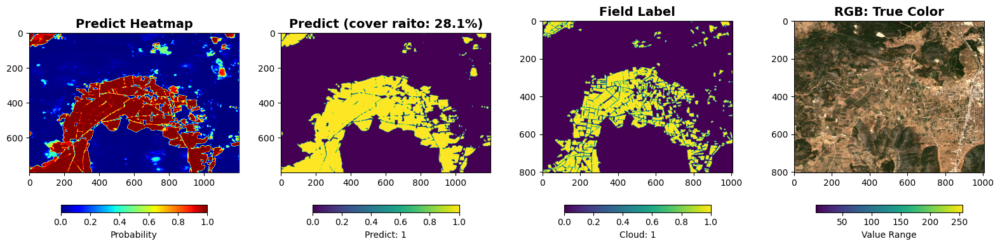

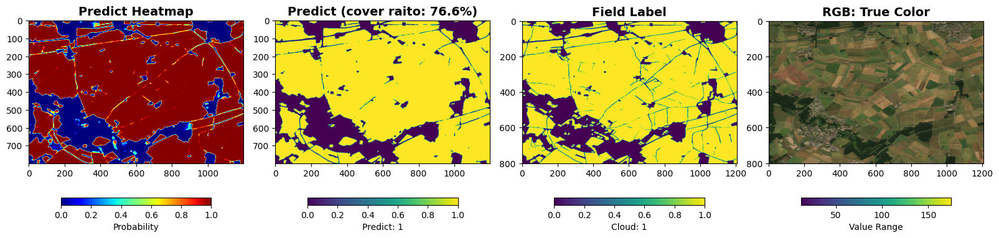

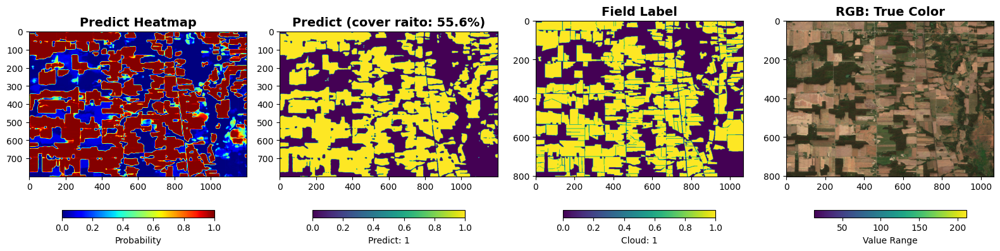

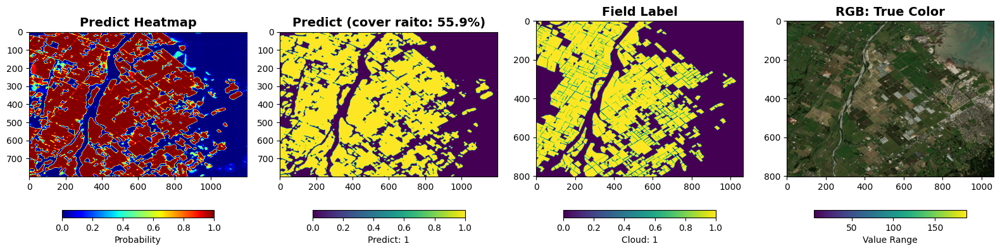

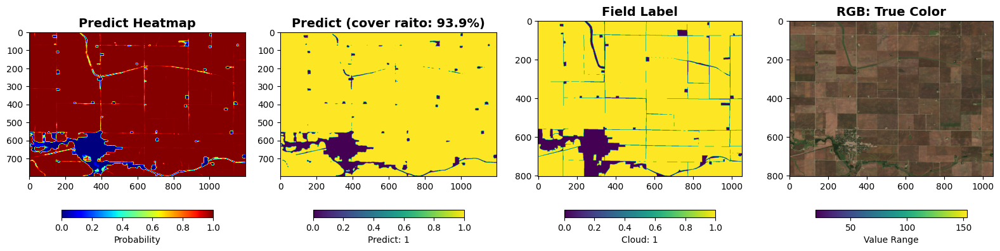

...

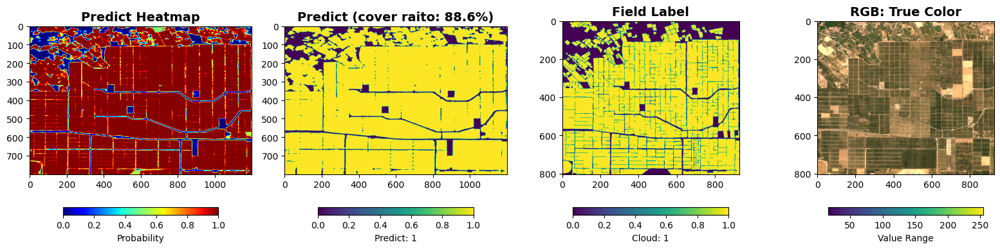

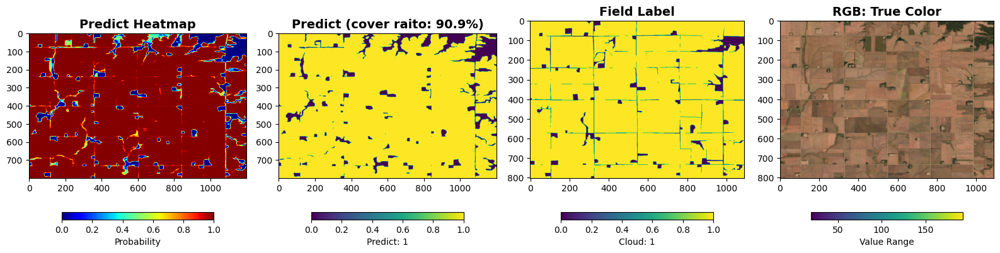

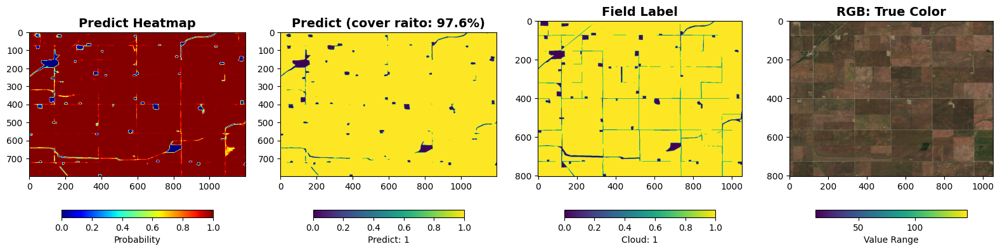

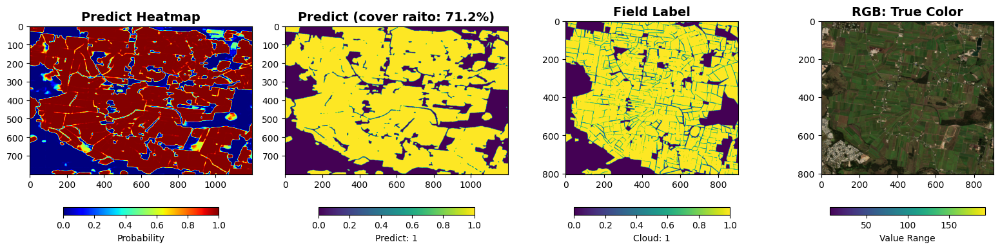

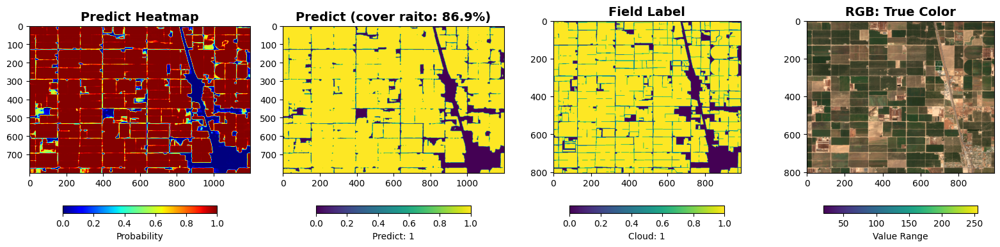

-- mask_bound -- ----------


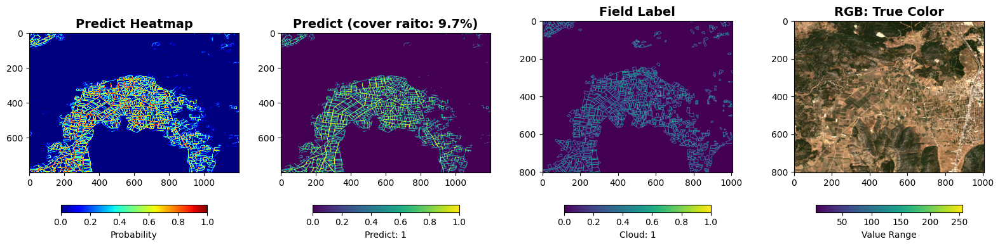

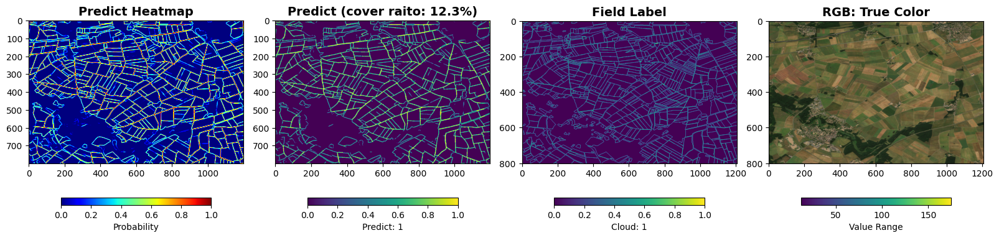

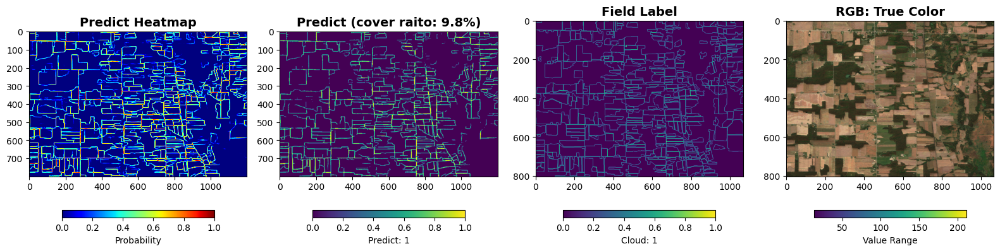

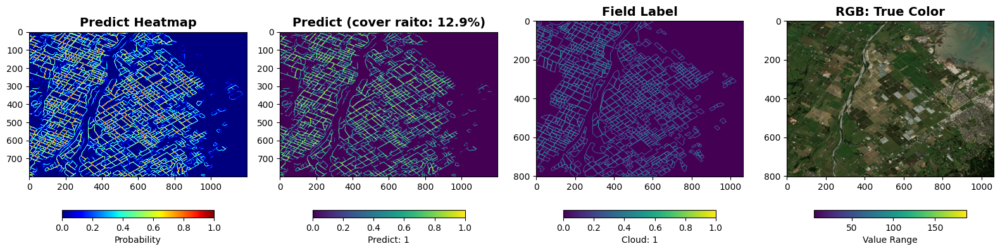

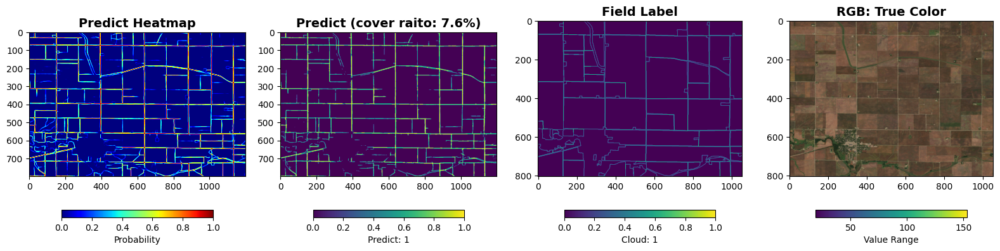

...

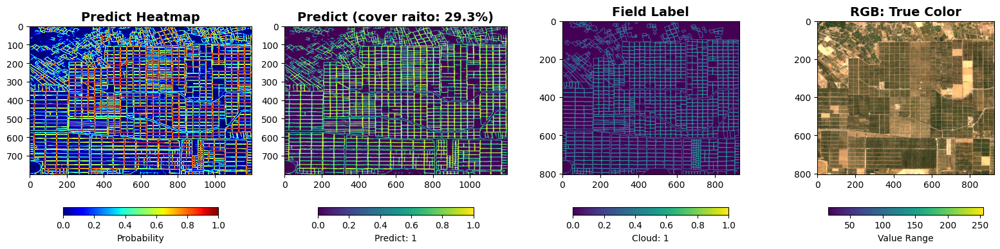

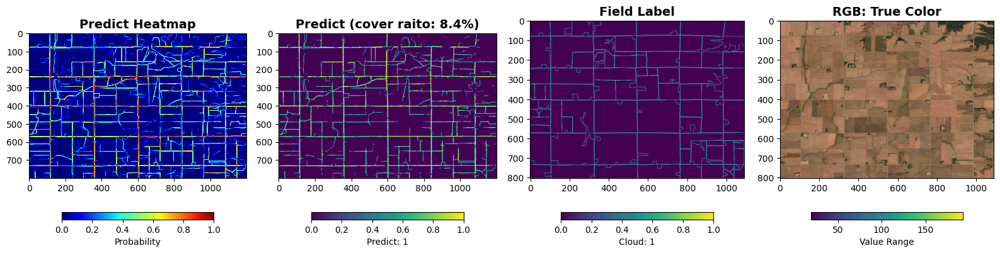

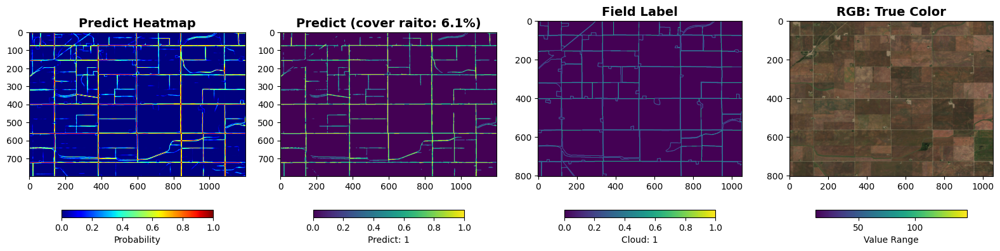

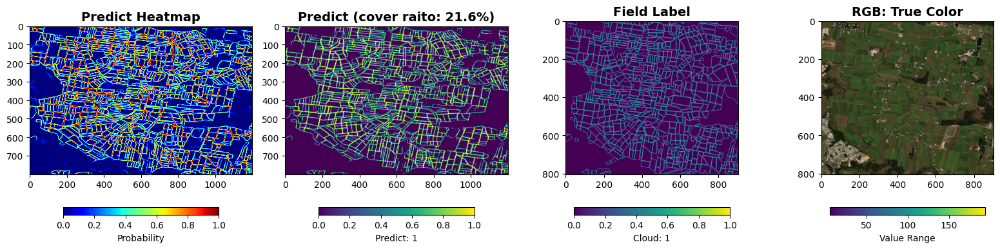

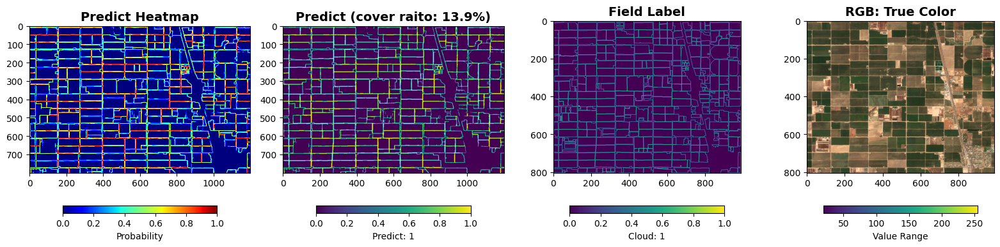

In [ ]:
if not CFG.opt_data_root:
    for mask_type_id, mask_type in enumerate(CFG.mask_types):
        print(f'-- {mask_type} --', '-'*10)
        val_dataset = FieldDataset(phase="valid", files=CFG.valid_files, transform=DataTransform(512, 512, 1), mask_type=mask_type)
        val_dataloader = DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=num_workers)
        for batch_i, (batch, file) in enumerate(zip(val_dataloader, CFG.valid_files)):

            _, label = batch
            label = label.squeeze(dim=0).detach().cpu().numpy()

            pred = weighted_pred_list[mask_type_id][batch_i]
            label = label.astype(int)

            imgs = np.load(f'{CFG.data_root}/{file}')["image"]
            rgb = convert_rgb(imgs, (50, 2500))

            cover_raito = np.sum(pred > mask_threshold_list[mask_type_id]) / (pred.shape[0] * pred.shape[1]) * 100

            plt.figure(figsize=(16, 4))

            plt.subplot(1, 4, 1)
            plt.title(f'Predict Heatmap', fontsize=14, fontweight='bold')
            plt.imshow(pred, cmap='jet', vmin=0, vmax=1)
            plt.colorbar(shrink=0.7, label='Probability', orientation='horizontal')

            plt.subplot(1, 4, 2)
            plt.title(f'Predict (cover raito: {cover_raito:.1f}%)', fontsize=14, fontweight='bold')
            plt.imshow((pred > mask_threshold_list[mask_type_id]).astype(np.uint8), vmin=0, vmax=1)
            plt.colorbar(shrink=0.7, label='Predict: 1', orientation='horizontal')

            plt.subplot(1, 4, 3)
            plt.title(f'Field Label', fontsize=14, fontweight='bold')
            plt.imshow(label, vmin=0, vmax=1)
            plt.colorbar(shrink=0.7, label='Cloud: 1', orientation='horizontal')

            plt.subplot(1, 4, 4)
            plt.title(f'RGB: True Color', fontsize=14, fontweight='bold')        
            plt.imshow(rgb)
            plt.colorbar(shrink=0.7, label='Value Range', orientation='horizontal')

            plt.tight_layout()
            # plt.savefig(f"{PATH_OUTPUT}/predict_{_id}_nir.png")
            plt.show();

### compute_pq

In [ ]:
import supervision as sv
# https://supervision.roboflow.com/detection/utils/
from skimage import morphology
# ---------------------------------------
from shapely.geometry import Polygon
from shapely import unary_union, MultiPolygon # unary_union cascaded_union
import numpy as np

# https://github.com/Solafune-Inc/FieldAreaSegmentation/blob/main/pq_score_compute/pq_caluculate.py

def getIOU(polygon1: Polygon, polygon2: Polygon) -> float:
    intersection = polygon1.intersection(polygon2).area
    union = polygon1.union(polygon2).area
    if union == 0:
        return 0
    return intersection / union


def compute_pq(gt_polygons: list, pred_polygons: list, iou_threshold=0.5):
    matched_instances = {}
    gt_matched = np.zeros(len(gt_polygons))
    pred_matched = np.zeros(len(pred_polygons))

    gt_matched = np.zeros(len(gt_polygons))
    pred_matched = np.zeros(len(pred_polygons))
    for gt_idx, gt_polygon in tqdm(enumerate(gt_polygons)):
        best_iou = iou_threshold
        best_pred_idx = None
        for pred_idx, pred_polygon in enumerate(pred_polygons):
            # if gt_matched[gt_idx] == 1 or pred_matched[pred_idx] == 1:
            #     continue
            
            iou = getIOU(gt_polygon, pred_polygon)
            if iou == 0:
                continue
            
            if iou > best_iou:
                best_iou = iou
                best_pred_idx = pred_idx
        if best_pred_idx is not None:
            matched_instances[(gt_idx, best_pred_idx)] = best_iou
            gt_matched[gt_idx] = 1
            pred_matched[best_pred_idx] = 1

    
    sq_sum = sum(matched_instances.values())
    num_matches = len(matched_instances)
    sq = sq_sum / num_matches if num_matches else 0
    rq = num_matches / ((len(gt_polygons) + len(pred_polygons))/2.0) if (gt_polygons or pred_polygons) else 0
    pq = sq * rq

    return pq, sq, rq


def polygons_to_mask(polygons: np.ndarray, shape) -> np.ndarray:
    mask = np.zeros(shape, dtype=np.uint8)
    cv2.fillPoly(mask, polygons, color=1)
    return mask

def get_pred_polygons(weighted_pred_th, buffer=0.95, area_th=70):
    
    weighted_pred_th = morphology.binary_opening(weighted_pred_th, morphology.square(2)).astype(np.uint8)
    pred_coords = sv.mask_to_polygons(weighted_pred_th)
    pred_polygons_ = [Polygon(c).buffer(0) for c in pred_coords]
    
    pred_polygons_ = unary_union(pred_polygons_)
    if pred_polygons_.geom_type == 'MultiPolygon':
        pred_polygons_ = list(pred_polygons_.geoms)
        
    if type(pred_polygons_) is list:
        pred_polygons_ = [p.buffer(buffer) for p in pred_polygons_ if p.area > area_th]
    else:
        print("Warning!! is_empty !!")
        pred_polygons_ = []
    
    pred_polygons = []
    for polygon in pred_polygons_:
        if polygon.geom_type == 'MultiPolygon':
            pred_polygons += list(polygon.geoms)
        else:
            pred_polygons += [polygon]
    
    pred_polygons = [p.buffer(0.75) for p in pred_polygons]
    
    return pred_polygons

In [ ]:
res_g_df = pd.DataFrame()

if bool(CFG.opt_data_root) & (not CFG.exec_test_pred) & (not bool(CFG.test_data_root)):

    ann_path = f'{CFG.original_data_root}/train_annotation.json'
    with open(ann_path, "r") as file:
        ann = json.load(file)

    res_df = pd.DataFrame()
    itertools_product = itertools.product(CFG.diff_thresholds, CFG.buffers, CFG.area_ths)
    print("itertools_product:", len(list(itertools_product)))
    itertools_product = itertools.product(CFG.diff_thresholds, CFG.buffers, CFG.area_ths)
    for diff_threshold, buffer, area_th in itertools_product:

        pqs, sqs, rqs = [], [], []
        weighted_pred_list = []
        weighted_pred_list_p = []
        true_count = []
        pred_count = []

        os.makedirs('valid', exist_ok=True)
        for batch_i, (label, file) in enumerate(zip(CFG.valid_segmentation, CFG.valid_files)):

            # Get logit
            # weighted_preds = np.load(f"{CFG.train_data_root}/valid/{os.path.split(file)[-1]}")["weighted_preds"]
            weighted_preds = []
            for mask_type_id, mask_type in enumerate(CFG.mask_types):
                preds = []
                for _ in range(len(cfgs)):
                    # Torch .squeeze(dim=[0, 1]).detach().cpu().numpy()
                    preds.append(all_raw_preds_list[mask_type_id][_][batch_i].squeeze(axis=(0, 1)))
                preds = np.stack(preds)

                # weighted_pred
                weighted_pred = np.average(preds, axis=0, weights=weights_list[mask_type_id])
                weighted_preds.append(weighted_pred)

            if len(weighted_preds) == 1:
                weighted_pred = weighted_preds[0]
                weighted_pred_th = np.where(weighted_pred > mask_threshold_list[0], 1, 0)
            else:
                weighted_pred = weighted_preds[0] * (1 - weighted_preds[1])
                weighted_pred_th = np.where(weighted_pred > diff_threshold, 1, 0)

            # To polygons
            # From Mask
            # true_polygons = [Polygon(np.array(l).reshape(-1, 2)).buffer(0) for l in label]
            # true_polygons = [p for p in true_polygons if p.area > 1]
            # From ann
            idx = int(os.path.split(file)[-1].split(".")[0].replace("train_", ""))
            true_polygons = []
            for a in ann['images'][idx]["annotations"]:
                true_polygons.append(Polygon(np.array(a['segmentation']).reshape(-1, 2)).buffer(0))
            true_polygons = [p for p in true_polygons if p.area > 0]
            pred_polygons = get_pred_polygons(weighted_pred_th, buffer, area_th)

            true_count.append(len(true_polygons))
            pred_count.append(len(pred_polygons))

            pq, sq, rq = compute_pq(true_polygons, pred_polygons)
            print(f"{file} | pq:{pq:.4f}", f"sq:{sq:.4f}", f"rq:{rq:.4f}", f"t_count:{len(true_polygons)}", f"p_count:{len(pred_polygons)}")
            pqs.append(pq), sqs.append(sq), rqs.append(rq)

            # Save pred
            # file_name = file.split("/")[-1].split(".")[0]
            # np.savez(f'./valid/{file_name}', weighted_preds=weighted_preds)
            weighted_pred_list.append(weighted_pred)

            # Check P
            m = polygons_to_mask([np.array(p.exterior.coords).astype(int) for p in pred_polygons], weighted_pred.shape)
            weighted_pred_list_p.append(m)

        print(f"Mean | pq:{np.mean(pqs):.4f}", f"sq:{np.mean(sqs):.4f}", f"rq:{np.mean(rqs):.4f}")

        res = pd.DataFrame(data=[pqs, sqs, rqs, true_count, pred_count], index=["pq", "sq", "rq", "t_count", "p_count"]).T
        res["diff_threshold"] = diff_threshold
        res["buffer"] = buffer
        res["area_th"] = area_th
        res_df = pd.concat([res_df, res], axis=0)
        
    res_g_df = res_df.groupby(["diff_threshold", "buffer", "area_th"]).agg("mean").reset_index()
    res_g_df.to_csv("./result.csv", index=False)

    max_idx = res_g_df["pq"].idxmax()
    diff_threshold = res_g_df["diff_threshold"].iloc[max_idx]
    buffer = res_g_df["buffer"].iloc[max_idx]
    area_th = res_g_df["area_th"].iloc[max_idx]

In [ ]:
res_g_df

""


In [ ]:
if bool(CFG.opt_data_root) & (not CFG.exec_test_pred) & (not bool(CFG.test_data_root)):
    
    val_dataset = FieldDataset(phase="valid", files=CFG.valid_files, transform=DataTransform(512, 512, 1), mask_type="mask")
    val_dataloader = DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=num_workers)
    for batch_i, (batch, file) in enumerate(zip(val_dataloader, CFG.valid_files)):

        _, label = batch
        label = label.squeeze(dim=0).detach().cpu().numpy()

        pred = weighted_pred_list[batch_i]
        label = label.astype(int)

        imgs = np.load(f'{CFG.data_root}/{file}')["image"]
        rgb = convert_rgb(imgs, (50, 2500))

        cover_raito = np.sum(pred > diff_threshold) / (pred.shape[0] * pred.shape[1]) * 100

        plt.figure(figsize=(16, 4))

        plt.subplot(1, 5, 1)
        plt.title(f'Predict Heatmap', fontsize=14, fontweight='bold')
        plt.imshow(pred, cmap='jet', vmin=0, vmax=1)
        plt.colorbar(shrink=0.7, label='Probability', orientation='horizontal')

        plt.subplot(1, 5, 2)
        plt.title(f'Predict(cover raito: {cover_raito:.1f}%)', fontsize=14, fontweight='bold')
        plt.imshow((pred > diff_threshold).astype(np.uint8), vmin=0, vmax=1)
        plt.colorbar(shrink=0.7, label='Predict: 1', orientation='horizontal')

        plt.subplot(1, 5, 3)
        plt.title(f'From polygonst: count {pred_count[batch_i]}', fontsize=14, fontweight='bold')
        plt.imshow(weighted_pred_list_p[batch_i].astype(np.uint8), vmin=0, vmax=1)
        plt.colorbar(shrink=0.7, label='Predict: 1', orientation='horizontal')

        plt.subplot(1, 5, 4)
        plt.title(f'Field Label: count {true_count[batch_i]}', fontsize=14, fontweight='bold')
        plt.imshow(label, vmin=0, vmax=1)
        plt.colorbar(shrink=0.7, label='Cloud: 1', orientation='horizontal')

        plt.subplot(1, 5, 5)
        plt.title(f'RGB: True Color', fontsize=14, fontweight='bold')        
        plt.imshow(rgb)
        plt.colorbar(shrink=0.7, label='Value Range', orientation='horizontal')

        plt.tight_layout()
        # plt.savefig(f"{PATH_OUTPUT}/predict_{_id}_nir.png")
        plt.show();

### Test

In [ ]:
if CFG.exec_test_pred:
    
    diff_threshold = CFG.diff_thresholds[0]
    buffer = CFG.buffers[0]
    area_th = CFG.area_ths[0]
    
    all_raw_preds_list = []
    for mask_type_id, mask_type in enumerate(CFG.mask_types):
        all_raw_preds = []
        for i, cfg in enumerate(cfgs):
            print(f'--{i}--', cfg['model']['encoder'], '-'*10)
            encoder_name = cfg['model']['encoder']
            os.makedirs(f'test_raw/{mask_type}/{encoder_name}', exist_ok=True)

            with open(f'training_opt_fold-{CFG.select_fold}/config.yaml','r') as f:
                config = yaml.safe_load(f)
            config['model']['slide']['h_crop'] = cfg['model']['height']
            config['model']['slide']['w_crop'] = cfg['model']['width']

            if mask_type == "mask":
                pass
            else:
                config['model']['slide']['image_div'] = 2

            test_dataset = FieldDataset(
                phase="test", files=CFG.test_files, 
                transform=DataTransform(cfg['model']['height'], cfg['model']['width'], config['model']['slide']['image_div']), 
                mask_type="mask"
            )
            test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=num_workers)

            with open('./config.yaml','r') as f:
                config = yaml.safe_load(f)
            config['model']['slide']['h_crop'] = cfg['model']['height']
            config['model']['slide']['w_crop'] = cfg['model']['width']

            model = Model(cfg=cfg, mask_type=mask_type)
            model_module = LightningModule(model, config)

            test_predict = trainer.predict(model_module, dataloaders=test_dataloader,
                                    ckpt_path=CFG.train_data_root + "/models/" + model_names[mask_type][i] + '.ckpt')

            raw_preds = [_[0] for _ in test_predict]
            all_raw_preds.append(raw_preds)
            
            # Save raw data
            for file, raw_pred in zip(CFG.test_files, raw_preds):
                file_ = file.split("/")[-1].split(".")[0]
                np.savez(f'test_raw/{mask_type}/{encoder_name}/{file_}', raw_pred=raw_pred)

        all_raw_preds_list.append(all_raw_preds)

In [ ]:
if CFG.test_data_root:
    
    diff_threshold = CFG.diff_thresholds[0]
    buffer = CFG.buffers[0]
    area_th = CFG.area_ths[0]
    
    all_raw_preds_list = []
    for mask_type in CFG.mask_types:
        all_raw_preds = []
        for i, cfg in enumerate(cfgs):
            print(f'-- {i} {mask_type} --', cfg['model']['encoder'], '-'*10)
            encoder_name = cfg['model']['encoder']
            # Load raw data
            raw_preds = []
            for file in CFG.test_files:
                file_ = file.split("/")[-1].split(".")[0]
                raw_preds.append(np.load(f'{CFG.test_data_root}/test_raw/{mask_type}/{encoder_name}/{file_}.npz')["raw_pred"])
            all_raw_preds.append(raw_preds)
        all_raw_preds_list.append(all_raw_preds)
    
    with open(f"{CFG.original_data_root}/sample.json", "r") as file:
        submit = json.load(file)
            
    os.makedirs('test', exist_ok=True)
    test_preds = []
    weighted_pred_list_p = []
    for batch_i, file in enumerate(CFG.test_files):

        # Get logit
        weighted_preds = []
        for mask_type_id, mask_type in enumerate(CFG.mask_types):
            preds = []
            for _ in range(len(cfgs)):
                preds.append(all_raw_preds_list[mask_type_id][_][batch_i].squeeze(axis=(0, 1)))
            preds = np.stack(preds)

            # weighted_pred
            weighted_pred = np.average(preds, axis=0, weights=weights_list[mask_type_id])
            weighted_preds.append(weighted_pred)

        if len(weighted_preds) == 1:
            weighted_pred = weighted_preds[0]
            weighted_pred_th = np.where(weighted_pred > mask_threshold_list[0], 1, 0)
        else:
            weighted_pred = weighted_preds[0] * (1- weighted_preds[1])
            weighted_pred_th = np.where(weighted_pred > diff_threshold, 1, 0)

        test_preds.append(weighted_pred)

        # To polygons
        pred_polygons = get_pred_polygons(weighted_pred_th, buffer, area_th)
        # pred_coords = sv.mask_to_polygons(weighted_pred_th)
        # pred_polygons = [Polygon(c).buffer(0) for c in pred_coords]
        # pred_polygons = [p for p in pred_polygons if p.area > 1]
        annotations = []
        for polygon in pred_polygons:
            if polygon.geom_type == 'MultiPolygon':
                for p in polygon.geoms:
                    segmentation = np.array(p.exterior.coords).ravel().round(2).tolist()
                    annotation = {'class': 'field', 'segmentation': segmentation}
                    annotations.append(annotation)
            else:
                segmentation = np.array(polygon.exterior.coords).ravel().round(2).tolist()
                annotation = {'class': 'field', 'segmentation': segmentation}
                annotations.append(annotation)
        submit['images'][batch_i]['annotations'] = annotations

        # Save pred
        file_name = file.split("/")[-1].split(".")[0]
        np.savez(f'./test/{file_name}', weighted_pred=weighted_pred)
        
        # Check P
        m = polygons_to_mask([np.array(p.exterior.coords).astype(int) for p in pred_polygons], weighted_pred.shape)
        weighted_pred_list_p.append(m)

    # Save Submit
    output_file_path = f"submit_fold{CFG.select_fold}.json"
    with open(output_file_path, "w", encoding="utf-8") as output_file:
        json.dump(submit, output_file, ensure_ascii=True, indent=4)
    print(len(submit['images']))

In [ ]:
if CFG.test_data_root:

    for batch_i, (pred, file) in enumerate(zip(test_preds, CFG.test_files)):

        imgs = np.load(f'{CFG.data_root}/{file}')["image"]
        rgb = convert_rgb(imgs, (50, 2500))

        cover_raito = np.sum(pred > diff_threshold) / (pred.shape[0] * pred.shape[1]) * 100

        plt.figure(figsize=(15, 5))

        plt.subplot(1, 4, 1)
        plt.title(f'Predict Heatmap {pred.shape[:2]}', fontsize=14, fontweight='bold')
        plt.imshow(pred, cmap='jet', vmin=0, vmax=1)
        plt.colorbar(shrink=0.7, label='Probability', orientation='horizontal')

        plt.subplot(1, 4, 2)
        plt.title(f'Predict (cover raito: {cover_raito:.1f}%)', fontsize=14, fontweight='bold')
        plt.imshow((pred > diff_threshold).astype(np.uint8), vmin=0, vmax=1)
        plt.colorbar(shrink=0.7, label='Predict: 1', orientation='horizontal')

        plt.subplot(1, 4, 3)
        plt.title(f'From polygons', fontsize=14, fontweight='bold')
        plt.imshow(weighted_pred_list_p[batch_i].astype(np.uint8), vmin=0, vmax=1)
        plt.colorbar(shrink=0.7, label='Predict: 1', orientation='horizontal')
        
        plt.subplot(1, 4, 4)
        plt.title(f'RGB: {file.split("/")[-1]} {imgs.shape[:2]}', fontsize=14, fontweight='bold')        
        plt.imshow(rgb)
        plt.colorbar(shrink=0.7, label='Value Range', orientation='horizontal')

        plt.tight_layout()
        # plt.savefig(f"{PATH_OUTPUT}/predict_{_id}_nir.png")
        plt.show();

        if batch_i == 20:
            break

In [ ]:
# %cd /kaggle/working
# !rm -r ./FieldAreaSegmentation
# !rm -r ./lightning_logs

In [ ]:
import json

def load_file(file_path) -> str:
    try:
        with open(file_path, 'r') as file:
            return json.load(file)
    except Exception as e:
        return "File not found or not a json format"


def check_dict(pdict : dict) -> str:
    image_names = [f'test_{x}.tif' for x in range(0, 50)]
    if not pdict:
        return "Empty dictionary"
    
    if pdict is None:
        return "Empty dictionary"
    
    if not "images" in pdict:
        return "No \"images\" key in dictionary"
    
    if not isinstance(pdict["images"], list):
        return "images is not a list"
    
    
    for image in pdict["images"]:
        if not "file_name" in image:
            return "No \"file_name\" key in image"
        if not image["file_name"] in image_names:
            return "Invalid file_name in image"
        image_names.remove(image["file_name"])
        
        if not "annotations" in image:
            return "No \"annotations\" key in image"
        
        if not isinstance(image["annotations"], list):
            return "annotations is not a list"
        
        for anno in image["annotations"]:
            if not "segmentation" in anno:
                return "No \"segmentation\" key in annotation"
            
            if not isinstance(anno["segmentation"], list):
                return "segmentation is not a list"
            
            if len(anno["segmentation"]) % 2 != 0:
                return "segmentation format is invalid, the number of ssegmnets should be even"
            
            if len(anno["segmentation"]) < 4:
                return "segmentation format is invalid, the number of segmnets should be at least 4"
    
    if not len(image_names) == 0:
        return "Some images are missing"
    
    return "Valid"

def coordinates_to_masks(coordinates, shape):
    masks = []
    for coord in coordinates:
        mask = np.zeros(shape, dtype=np.uint8)
        cv2.fillPoly(mask, [np.array(coord)], 1)
        masks.append(mask)
    return masks

In [ ]:
if CFG.test_data_root:
    pdict = load_file(output_file_path)
    check = check_dict(pdict)
    print(check)
    
    # ----
    true_polygons = []
    for idx, file in enumerate(CFG.test_files):
        imgs = np.load(f'{CFG.data_root}/{file}')["image"]
        segmentation_list = []
        for a in pdict['images'][idx]["annotations"]:
            true_polygons.append(Polygon(np.array(a['segmentation']).reshape(-1, 2)).buffer(0))
            segmentation_list.append(a['segmentation'])
        coordinates = [np.array(_).reshape(-1, 2).astype(int) for _ in segmentation_list]
        masks = coordinates_to_masks(coordinates, imgs.shape[:2])
        plt.imshow(np.sum(masks, axis=0).astype(bool))
        break